<a href="https://colab.research.google.com/github/khelloufleila/VSB-Power-Line-Fault-Detection/blob/main/Projet7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install siml

  Created wheel for siml: filename=siml-0.4.0-py3-none-any.whl size=13726 sha256=d176b1a56bbaa1d464b26c6785928fb8a7edf2e520513acb05b71235106d71b2
  Stored in directory: /root/.cache/pip/wheels/78/4a/0b/6d7bfb04dad3de613c870498a7c0132aee2a863b5796a4c10c
Successfully built siml


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pyarrow.parquet as pq #reading parquet files 
import matplotlib.pyplot as plt
import os
import seaborn as sns
import scipy
from statsmodels.robust import mad
import collections
from scipy.signal import *
import random
import gc



#used for plotting
import plotly.graph_objects as go
#used for feature engineering(signal processing tools)
from scipy.fftpack import fft
from scipy.signal import welch
from siml.sk_utils import *
from siml.signal_analysis_utils import *

from tqdm import tqdm
import ast

import warnings
warnings.filterwarnings('ignore')


In [ ]:
metadata_train = pd.read_csv('/content/drive/MyDrive/Projet Option Stage /metadata_train.csv')
metadata_train.head(6)

,signal_id,id_measurement,phase,target
0,0,0,0,0
1,1,0,1,0
2,2,0,2,0
3,3,1,0,1
4,4,1,1,1
5,5,1,2,1


In [ ]:
metadata_train.shape

(8712, 4)

In [ ]:
# Ckecking if each id measurement has 3 phases:
for i in range(0, len(metadata_train),3):
    temp=[]
    for i in range(3):
        temp.append(metadata_train.loc[i]['phase'])
    if (temp!= [0,1,2]):
        print("error")
        break
    
print('There are 3 phases 0, 1, 2 for each id_measurement')        

There are 3 phases 0, 1, 2 for each id_measurement


In [ ]:
metadata_train.corr()

,signal_id,id_measurement,phase,target
signal_id,1.000000,1.000000,0.000325,-0.023992
id_measurement,1.000000,1.000000,0.000000,-0.023993
phase,0.000325,0.000000,1.000000,0.001772
target,-0.023992,-0.023993,0.001772,1.000000


In [ ]:
for col in metadata_train.columns:
    print("Number of unique values in ", col, "is", metadata_train[col].unique().shape[0])

Number of unique values in  signal_id is 8712
Number of unique values in  id_measurement is 2904
Number of unique values in  phase is 3
Number of unique values in  target is 2


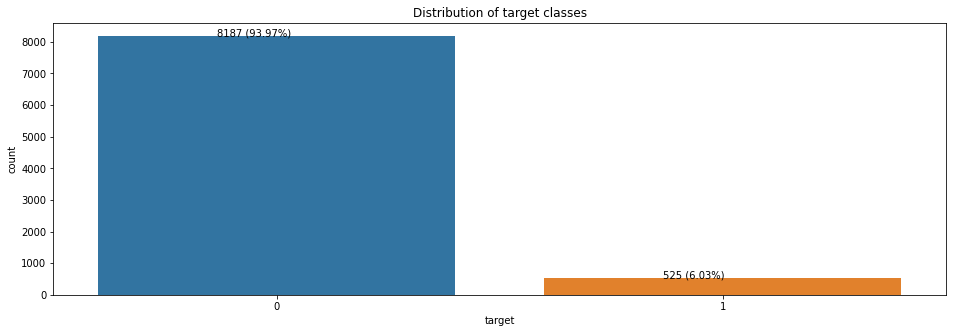

In [ ]:
plt.figure(figsize=(16, 5))
splot = sns.countplot(x='target', data=metadata_train)
# https://github.com/mwaskom/seaborn/issues/1582
for ind, p in enumerate(splot.patches):
  percent = np.round((metadata_train[metadata_train['target']==ind].shape[0]/metadata_train['target'].shape[0])*100, 2)
  splot.annotate(str(metadata_train[metadata_train['target']==ind].shape[0]) + f" ({percent}%)", 
                 (p.get_x()+p.get_width()/3, p.get_height()))
plt.title("Distribution of target classes")
plt.show()

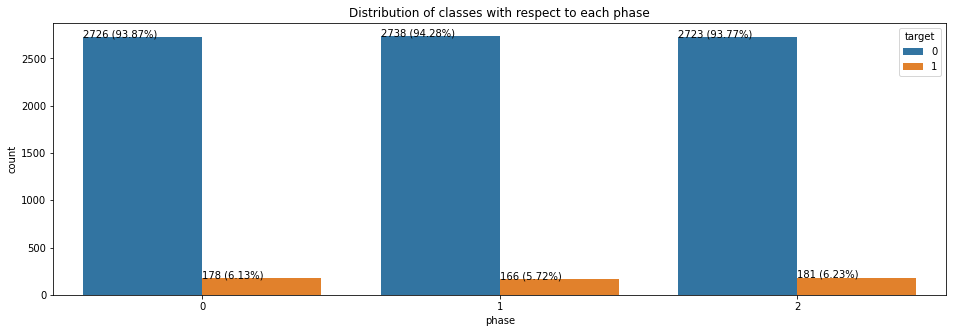

In [ ]:
plt.figure(figsize=(16, 5))
splot = sns.countplot(x="phase", data=metadata_train, hue="target")
# Get the total number of signals present in each phase
total_phases = metadata_train[metadata_train['phase']==0].shape[0]
num_points = []
# https://github.com/mwaskom/seaborn/issues/1582
for ind, p in enumerate(splot.patches):
    # Phase=[0,1,2] for indices [0,1,2] and indices [3,4,5] respectively
    phase = ind%3
    # target=[0,1] for indices [0,1], [2,3], [4,5] respectively
    tar = ind//3
    # Store the number of data points for the respective phase and target
    num_points.append(metadata_train.loc[(metadata_train['target']==tar) & (metadata_train['phase']==phase)]['phase'].shape[0])
    # Get the percentage of the number of data points
    num_phase_percent = np.round((num_points[-1]/total_phases)*100, 2)
    # Annotate the bar plot
    splot.annotate(str(num_points[-1])+f" ({num_phase_percent}%)", (p.get_x(), p.get_height()))
plt.title("Distribution of classes with respect to each phase")
plt.show()

In [ ]:
#Check if id_measurement is same then is target label 
for i in range(0, len(metadata_train), 3):
    temp1= metadata_train.loc[i]['target']
    #print("temp1= ",temp1)
    f=0
    for j in range(1,3):
        temp2= metadata_train.loc[i+j]['target']
        #print("temp2= ",temp2)
        if temp1!=temp2:
            print(metadata_train.loc[i:i+2])
            f=1
    if f==1:
        print("The same id_measurement does not means the same target value!!! ")
        break 
        

     signal_id  id_measurement  phase  target
201        201              67      0       1
202        202              67      1       1
203        203              67      2       0
The same id_measurement does not means the same target value!!! 


In [ ]:
df1 = pq.read_pandas('/content/drive/MyDrive/Projet Option Stage /train.parquet', columns=[str(i) for i in range(3100)]).to_pandas()

In [ ]:
df2= pq.read_pandas('/content/drive/MyDrive/Projet Option Stage /train.parquet', columns=[str(i) for i in range(3100, 6000)]).to_pandas()

In [ ]:
df3= pq.read_pandas('/content/drive/MyDrive/Projet Option Stage /train.parquet', columns=[str(i) for i in range(6000, 8712)]).to_pandas() 

In [ ]:
data= pd.concat([df1,df2, df3], axis=1)
data.shape

(800000, 8712)

In [ ]:
data.to_csv('/content/drive/MyDrive/Projet Option Stage /'+"data.csv", sep=",")

In [ ]:
data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,8672,8673,8674,8675,8676,8677,8678,8679,8680,8681,8682,8683,8684,8685,8686,8687,8688,8689,8690,8691,8692,8693,8694,8695,8696,8697,8698,8699,8700,8701,8702,8703,8704,8705,8706,8707,8708,8709,8710,8711
0,18,1,-19,-16,-5,19,-15,15,-1,-16,-9,23,-1,-17,16,-8,17,-10,21,-8,-12,-7,23,-15,-20,13,4,-20,1,15,13,-2,-17,5,16,-20,9,-16,7,10,...,19,17,-16,-5,1,19,-18,1,13,-19,6,12,-18,-8,18,-9,19,-7,-12,-1,-3,-3,-19,8,3,-12,18,-6,-11,-5,18,-22,12,8,13,6,-21,-15,-9,20
1,18,0,-19,-17,-6,19,-17,16,0,-15,-10,22,0,-16,17,-7,17,-10,20,-9,-12,-7,24,-14,-20,14,4,-20,1,15,14,-3,-18,5,16,-20,9,-15,7,9,...,19,23,-13,0,0,19,-19,0,13,-20,7,12,-17,-8,17,-9,19,-7,-12,0,-1,-2,-18,10,6,-10,18,-5,-12,-7,17,-21,12,8,14,7,-19,-15,-8,21
2,17,-1,-20,-17,-6,19,-17,15,-3,-15,-10,22,-1,-16,17,-9,16,-11,20,-8,-12,-6,24,-14,-20,13,4,-20,1,15,11,-3,-18,5,16,-20,8,-16,7,10,...,19,12,-18,-6,-1,19,-19,0,14,-20,5,12,-17,-8,17,-9,18,-10,-14,1,-1,-1,-17,11,4,-10,19,-5,-12,-9,16,-21,13,8,15,8,-18,-14,-8,22
3,18,1,-19,-16,-5,20,-16,16,0,-15,-9,22,-1,-17,17,-7,18,-9,21,-8,-12,-5,25,-14,-21,14,4,-20,1,15,14,-3,-17,5,16,-20,8,-16,7,10,...,19,21,-15,-3,0,19,-19,0,14,-18,4,11,-18,-9,16,-10,19,-9,-13,1,-1,-2,-19,8,3,-9,19,-4,-13,-9,16,-21,12,8,15,8,-19,-14,-7,23
4,18,0,-19,-16,-5,20,-17,16,-2,-14,-8,24,-2,-17,16,-9,16,-11,20,-8,-13,-6,24,-13,-21,14,4,-20,1,15,14,-3,-18,4,16,-21,8,-16,7,10,...,19,19,-14,-2,1,19,-18,2,14,-18,5,12,-18,-9,16,-10,19,-8,-13,-1,-2,-2,-18,9,5,-9,20,-4,-12,-8,17,-22,12,8,15,8,-18,-14,-8,23


In [ ]:
print("On a", data.shape[1], " signals et peut observer que chaque signal se compose de " ,data.shape[0], " points et que le numéro de colonne correspond ici à l identifiant du signal dans metadata_train ")

On a 8712  signals et peut observer que chaque signal se compose de  800000  points et que le numéro de colonne correspond ici à l identifiant du signal dans metadata_train 


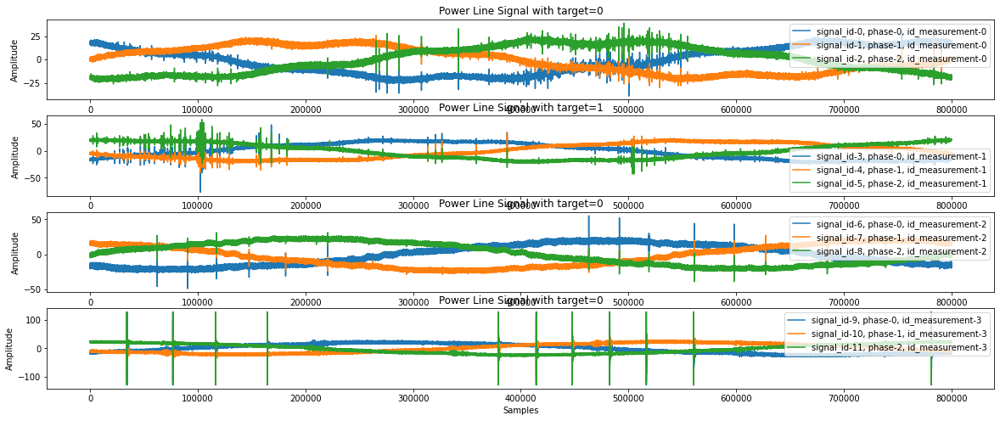

In [ ]:
sig_list = metadata_train.head(12).values
plt.figure(figsize=(20,8))
n_rows = 4
n_cols = 1
for ind, val in enumerate(sig_list):
  plt.subplot(n_rows, n_cols, (ind//3)+1)
  plt.plot(data[str(val[0])].values[::,], label=f"signal_id-{val[0]}, phase-{val[2]}, id_measurement-{val[1]}")
  plt.legend()
  plt.title(f'Power Line Signal with target={val[3]}')
    
  plt.xlabel('Samples')
  plt.ylabel('Amplitude')
plt.show()

In [ ]:
#metadata_test= pd.read_csv('/content/drive/MyDrive/Projet7/metadata_test.csv')
#print(metadata_test.shape)
#metadata_test.head()

In [ ]:
#test = pq.read_pandas('/content/drive/MyDrive/Projet7/test.parquet').to_pandas()
#test

# Feature Extraction Functions:
1. Statistical Features
3. Root Mean Square Energy
4. Zero-Crossing Rate
5. Entropy features
6. welch_max_power_and_frequency

In [ ]:
def describe_freq(signal):
    mean = np.mean(signal)
    std = np.std(signal) 
    maxv = np.amax(signal) 
    minv = np.amin(signal) 
    median = np.median(signal)
    skew = scipy.stats.skew(signal)
    kurt = scipy.stats.kurtosis(signal)
    q0 = np.quantile(signal, 0.10)
    q1 = np.quantile(signal, 0.25)
    q3 = np.quantile(signal, 0.75)
    q4 = np.quantile(signal, 0.90)
    mode = scipy.stats.mode(signal)[0][0]
    iqr = scipy.stats.iqr(signal) 
    rmse= np.sqrt(np.mean(signal**2))
    
    return [mean, std, maxv, minv, median, skew, kurt, q0, q1, q3,q4, mode, iqr, rmse]

In [ ]:
def describe_entropy(signal):
    counter_values= collections.Counter(signal).most_common()
    proba= [el[1]/len(signal) for el in counter_values]
    entropy=scipy.stats.entropy(proba)
    return entropy 

In [ ]:
def describe_crossings(signal):
    zero_crossing_index= np.nonzero(np.diff(np.array(signal)> 0))[0]
    len_zero_crossing= len(zero_crossing_index)
    mean_crossing_index= np.nonzero(np.diff(np.array(signal)> np.nanmean(signal)))[0]
    len_mean_crossing= len(mean_crossing_index)
    return [len_zero_crossing, len_mean_crossing ]

[texte du lien](https://)**Power Spectral density**

similiar to fft but this also considers the power distribution at each frequency.

Welch’s method computes an estimate of the power spectral density by dividing the data into overlapping segments, computing a modified periodogram for each segment and averaging the periodograms.

In [ ]:
f_values, psd_values = welch(data['0'].values, fs=50)
fig = go.Figure(data=go.Scatter(x = f_values, y = psd_values,mode = 'lines'))
fig.update_layout(
    title="frquency spectrum",
    xaxis_title="Frequency",
    yaxis_title="PSD",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    )
)
fig.show()

In [ ]:
def welch_max_power_and_frequency(signal):
    f, Pxx = welch(signal)
    ix = np.argmax(Pxx)
    strong_count = np.sum(Pxx>2.5)
    avg_amp = np.mean(Pxx)
    sum_amp = np.sum(Pxx)
    std_amp = np.std(Pxx)
    median_amp = np.median(Pxx)
    return [Pxx[ix], f[ix], strong_count, avg_amp, sum_amp, std_amp, median_amp]

In [ ]:
fourier_values = fft(data['0'].values)
fourier_values.shape

(800000,)

In [ ]:
#N is number of points in our input signal
N=800000
#T is the time period which is inverseof frequency which is 50Hz
T = 1/50
#fft_values contains the filtered useful values from fft_values_ vector
fourier_values_filtered = 2.0/N * np.abs(fourier_values[N//2:])
#f_values contains the frquency values
f_values = np.linspace(0.0, 1.0/(2.0*T), N//2)



In [ ]:
fig = go.Figure(data=go.Scatter(x = f_values, y = fourier_values_filtered,mode = 'lines'))
fig.update_layout(
    title="frquency spectrum",
    xaxis_title="Frequency",
    yaxis_title="Amplitude",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    )
)
fig.show()

In [ ]:
def extract_fourier_features(signal,N=800000,T=1/50):
    '''
    converts a signal from time spectrum to frequency spectrum
    and returns only the features required as mentioned above
    '''
    fourier_values = fft(signal)
    fourier_values_filtered = 2.0/N * np.abs(fourier_values[0:N//2])
    return fourier_values_filtered


def filter_features_fourier(features,mph,no_features=8):
    '''
    returns fourier transformed features by extracting peaks and 
    considering only required number of peaks.
    mph-detect peaks that are greater than minimum peak height
    '''
    indices_peaks = detect_peaks(features,mph = mph)
    #print(indices_peaks)
    values = features[indices_peaks]
    if len(values)< no_features:
        return np.append(values , [0]*(no_features-len(values)))
    else:
        return values[:no_features]

In [ ]:
def get_features(signal):
    entropy = describe_entropy(signal)
    statistics = describe_freq(signal)
    crossings = describe_crossings(signal)
    powerfreq= welch_max_power_and_frequency(signal)
    return [entropy] + statistics + crossings + powerfreq

In [ ]:
total_features = []
   
for i in tqdm(range(0,8712)):
    fourier_features = np.empty((3,8))
    features = []    
    signal =  pq.read_pandas('/content/drive/MyDrive/Projet Option Stage /train.parquet',columns=[str(i)]).to_pandas()[str(i)].values

    #minimum peak height which can be used to filter fourier features
    mph = signal.min() + (signal.max() - np.abs(signal.min()))/10
    
    #fourier features
    fourier_features_ = extract_fourier_features(signal)
    fourier_features = filter_features_fourier(fourier_features_,mph)
    
    features.extend(fourier_features)

    total_features.append(features) 

In [ ]:
sig_features = np.array(total_features)

cols=[]
for i in range(0,8):
  cols.append('feat'+str(i))
fourier_df = pd.DataFrame(sig_features, columns =cols)  
fourier_df.to_csv('/content/drive/MyDrive/Projet Option Stage /'+"fourier_feat.csv", sep=",")

In [ ]:

feature_columns= [ 'signal_id', 'entropy', 'mean', 'std', 'maxv', 'minv', 'median', 'skew', 'kurt', 
                         'q0','q1', 'q3','q4', 'mode', 'iqr', 'rmse', 'len_zero_crossing', 'len_mean_crossing',
                       'max_amp', 'max_freq', 'strong_amp_count', 'avg_amp', 'sum_amp', 'std_amp', 'median_amp', 'fault']

data_type = "data"
df_feature_matrix= pd.DataFrame([], columns= feature_columns)
for signal_id in metadata_train.signal_id:
    signal_0 = data[str(signal_id)]
    signal_features= get_features(signal_0)
    df_features = pd.DataFrame([[signal_id] + signal_features + [metadata_train.target[metadata_train.signal_id == signal_id].values[0]]], columns=feature_columns)

    df_feature_matrix = df_feature_matrix.append(df_features, ignore_index=True)  # Append Feature Matrix Data Frame

# Store feature matrix to CSV (commented out for this notebook, but left in for example.)
df_feature_matrix.to_csv('/content/drive/MyDrive/Projet Option Stage/'+data_type+"_get_features.csv", sep=",")

In [ ]:
df_feature= pd.read_csv('/content/drive/MyDrive/Projet Option Stage /data_get_features.csv')
fourier_df=pd.read_csv('/content/drive/MyDrive/Projet Option Stage /fourier_feat.csv')
features= [ 'entropy', 'mean', 'std', 'maxv', 'minv', 'median', 'skew', 'kurt', 
                         'q0','q1', 'q3', 'q4','mode', 'iqr', 'rmse', 'len_zero_crossing', 'len_mean_crossing',
                       'max_amp', 'max_freq', 'strong_amp_count', 'avg_amp', 'sum_amp', 'std_amp', 'median_amp']
fourier_cols= ['feat0','feat1','feat2','feat3','feat4','feat5','feat6','feat7']                       

target= ["fault"]
df= df_feature[features]
fouri_df= fourier_df[fourier_cols]
data_features= pd.concat([df,fouri_df], axis=1)
data_features["fault"]= df_feature[target]
data_features

,entropy,mean,std,maxv,minv,median,skew,kurt,q0,q1,q3,q4,mode,iqr,rmse,len_zero_crossing,len_mean_crossing,max_amp,max_freq,strong_amp_count,avg_amp,sum_amp,std_amp,median_amp,feat0,feat1,feat2,feat3,feat4,feat5,feat6,feat7,fault
0,3.691887,-0.960271,13.870724,33,-39,-1.0,0.003591,-1.433378,-20.0,-13.0,11.0,18.0,18,24.0,4.742362,7268,7468,47.831062,0.378906,18,1.995473,257.415955,5.220994,0.612473,19.406276,0.225003,2.402200,0.272933,0.141869,0.045181,0.086006,0.106678,0
1,3.663108,-0.194125,13.037134,26,-30,0.0,0.006952,-1.422562,-18.0,-12.0,12.0,17.0,-17,24.0,4.956490,8817,7990,41.982578,0.378906,20,1.836459,236.903198,4.641738,0.458779,18.240737,0.349034,2.209746,0.284463,0.093602,0.032817,0.067562,0.116957,0
2,3.686704,-0.043555,13.684282,39,-28,0.0,0.005427,-1.426438,-18.0,-13.0,12.0,18.0,-18,25.0,4.979899,7316,7048,38.999954,0.378906,22,1.935738,249.710236,4.503104,0.652928,19.162070,0.369614,2.196515,0.288878,0.122011,0.046373,0.106883,0.138665,0
3,3.645577,-0.997401,13.673630,52,-77,-1.0,-0.001616,-1.474346,-19.0,-14.0,12.0,17.0,-19,26.0,4.075930,5718,5840,29.060942,0.148438,16,1.590296,205.148132,3.224866,0.798159,19.240971,0.149745,1.387577,0.250357,0.129503,0.061754,0.030128,0.018160,1
4,3.604326,-0.175586,12.938372,33,-40,0.0,-0.000686,-1.478338,-17.0,-13.0,12.0,17.0,-17,25.0,4.931368,4210,4204,20.080660,0.148438,19,1.375932,177.495178,2.577763,0.439266,18.201435,0.099886,0.131096,1.397082,0.185577,0.095271,0.027941,0.058787,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8707,3.680224,-1.465155,12.994770,34,-34,-1.0,-0.002431,-1.456477,-19.0,-13.0,11.0,16.0,16,24.0,3.927279,4304,3226,49.766651,0.003906,19,3.020191,389.604675,8.131933,0.479636,18.234295,0.063686,0.472018,1.126217,0.604003,0.318325,0.068544,0.050267,0
8708,3.738676,-1.473611,13.855336,25,-28,-2.0,0.001417,-1.463561,-20.0,-14.0,11.0,17.0,18,25.0,3.615759,4468,3470,43.401005,0.074219,16,2.308487,297.794769,6.516478,0.348157,19.461875,0.067596,0.796427,1.257471,0.576875,0.300968,0.077492,0.050795,0
8709,3.743259,-1.003486,14.693115,37,-79,0.0,-0.014534,-1.433985,-21.0,-15.0,14.0,18.0,18,29.0,2.933922,6942,3876,18.879847,0.031250,12,1.333504,172.021988,2.445804,0.660026,20.646691,1.112545,0.773247,0.632877,0.346927,0.070884,0.182495,0.118627,0
8710,3.767086,-0.170313,14.107939,52,-76,-1.0,0.014371,-1.405970,-19.0,-13.0,14.0,19.0,19,27.0,2.692016,3168,3754,17.287521,0.031250,15,1.298961,167.565918,2.294397,0.493571,19.745831,1.534309,1.091698,0.776683,0.266818,0.160236,0.241421,0.193238,0


In [ ]:
data_features.shape

(8712, 33)

In [ ]:
fault= len(data_features[data_features.fault==1])
fault

525

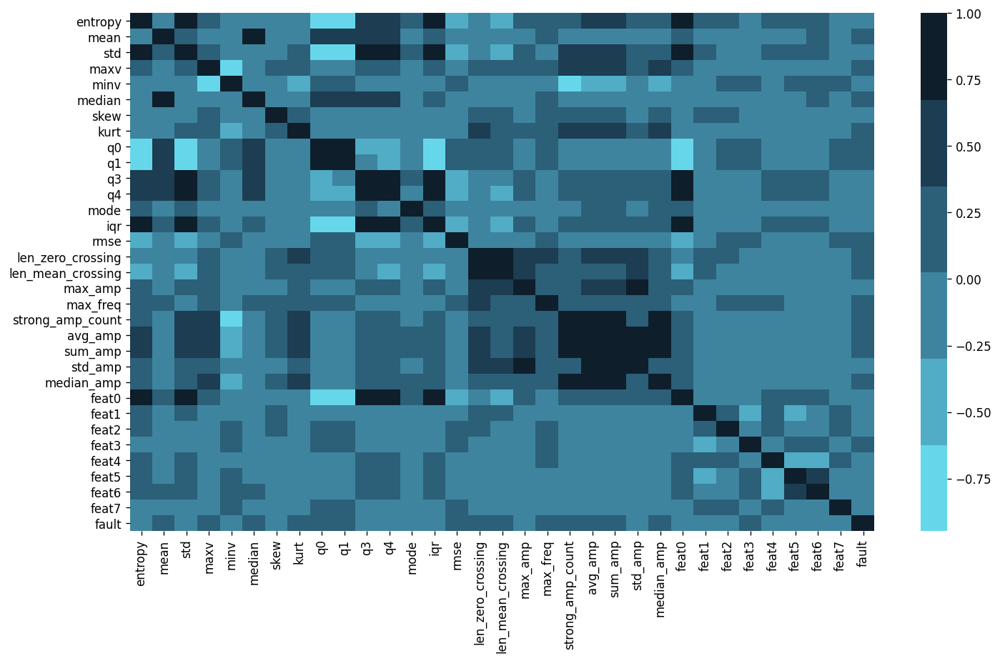

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
blues = ["#66D7EB", "#51ACC5", "#3E849E", "#2C5F78", "#1C3D52", "#0E1E2B"]
cor = data_features.corr()
f, ax = plt.subplots(figsize=(14, 8), dpi= 120, facecolor='w', edgecolor='k')
sns.heatmap(cor, cmap=blues)

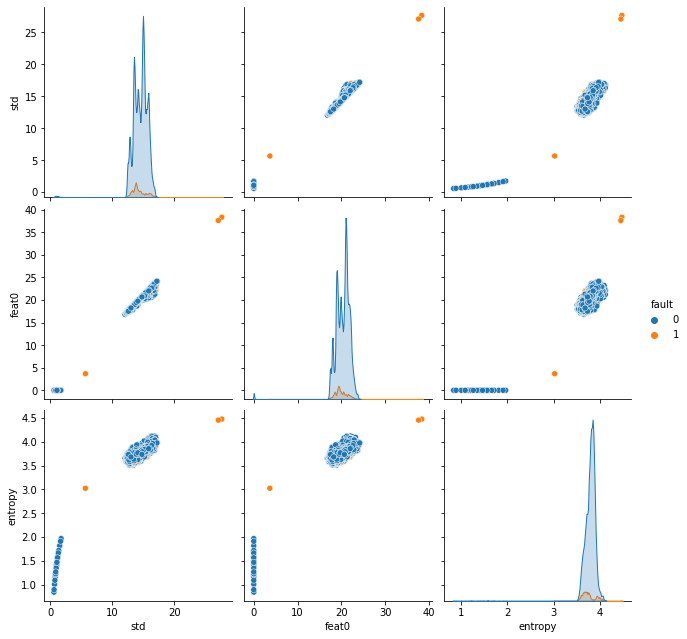

In [ ]:
# Detail
sns.pairplot(data_features[["std", 'feat0','entropy',  "fault"]], hue="fault",  height=3, diag_kind="kde", diag_kws=dict(shade=True, bw=.05, vertical=False) )


# Machine Learning 

In [ ]:
import numpy as np
import pandas as pd
import warnings

## Plotting libraries
import seaborn as sns
import matplotlib.pyplot as plt

## Sklearn Libraries
from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import f1_score, confusion_matrix, roc_curve, auc, classification_report, recall_score, precision_recall_curve
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
import lightgbm as lgb
from sklearn.linear_model import SGDRegressor
from prettytable import PrettyTable



random_state = 1
class Create_ensemble(object):
    def __init__(self, n_splits, base_models):
        self.n_splits = n_splits
        self.base_models = base_models

    def predict(self, X, y, T):
        X = np.array(X)
        y = np.array(y)
        T = np.array(T)
        no_class = len(np.unique(y))

        folds = list(StratifiedKFold(n_splits=self.n_splits, shuffle=True, 
                                     random_state = random_state).split(X, y))

        train_proba = np.zeros((X.shape[0], no_class))
        test_proba = np.zeros((T.shape[0], no_class))
        
        train_pred = np.zeros((X.shape[0], len(self.base_models)))
        test_pred = np.zeros((T.shape[0], len(self.base_models)* self.n_splits))
        f1_scores = np.zeros((len(self.base_models), self.n_splits))
        recall_scores = np.zeros((len(self.base_models), self.n_splits))
        clf_=[]
        # PrettyTable
        tb = PrettyTable()
        tb.field_names = ['Model', 'CV-', 'recall', 'f1_score', 'mcc']
        #DataFrame 
        Frame = pd.DataFrame()

        test_col = 0
        for i, clf in enumerate(self.base_models):
            
            for j, (train_idx, valid_idx) in enumerate(folds):
                
                X_train = X[train_idx]
                Y_train = y[train_idx]
                X_valid = X[valid_idx]
                Y_valid = y[valid_idx]
                
                clf.fit(X_train, Y_train)
                
                valid_pred = clf.predict(X_valid)
                recall  = recall_score(Y_valid, valid_pred, average='macro')
                f1 = f1_score(Y_valid, valid_pred, average='macro')
                mcc = matthews_corrcoef(Y_valid, valid_pred)
                
                recall_scores[i][j] = recall
                f1_scores[i][j] = f1
                
                train_pred[valid_idx, i] = valid_pred
                test_pred[:, test_col] = clf.predict(T)
                test_col += 1
                
                ## Probabilities
                valid_proba = clf.predict_proba(X_valid)
                train_proba[valid_idx, :] = valid_proba
                test_proba  += clf.predict_proba(T)
                
                #print( "Model- {} and CV- {} recall: {}, f1_score: {}, mcc: {}".format(i, j, recall, f1, mcc))
                tb.add_row([i, j, recall, f1, mcc])
                new_row= {'Model':i, 'CV':j, 'recall':recall, 'f1':f1, 'mcc':mcc}
                Frame = Frame.append(new_row, ignore_index=True)
                clf_.append(clf)
            test_proba /= self.n_splits
            
        return train_proba, test_proba, train_pred, test_pred, clf_, Frame



In [ ]:
#Unbalanced 
# LogisticRegression
params_log = {'C': [10**x for x in range(-4,5)],
          'l1_ratio': [0, 0.1, 0.3, 0.5, 0.7, 0.9, 1]}
log_clf = LogisticRegression(penalty='elasticnet', solver='saga', random_state=42)

# Perform stratified 5-fold cross validation
rand_log_clf = RandomizedSearchCV(log_clf, param_distributions=params_log, random_state=42, return_train_score=True,
                              n_jobs=-1)

# Random Forest
params_rf = {'n_estimators': [10, 50, 100, 500, 1000], 
          'max_depth': [2, 3, 4, 5, 6],
          'min_samples_split': [0.02, 0.04, 0.08, 0.16, 0.32, 0.50]}
rf_clf = RandomForestClassifier(random_state=42)
rand_rf_clf = RandomizedSearchCV(rf_clf, param_distributions=params_rf, random_state=42, return_train_score=True,
                              n_jobs=-1)

# LightGBM
params_lgb = {'n_estimators': [10, 50, 100, 500, 1000], 
          'max_depth': [2, 3, 4, 5, 6],
          'learning_rate': [1e-2, 1e-1, 0.5, 0.9],
          'reg_alpha': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2], 
          'reg_lambda': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]}
lgb_clf = lgb.LGBMClassifier(random_state=42,
                             importance_type='gain')
rand_lgb_clf = RandomizedSearchCV(lgb_clf, param_distributions=params_lgb, random_state=42, return_train_score=True,
                              n_jobs=-1)

# XGBoost
params_xgb = {'n_estimators': [10, 50, 100, 500, 1000], 
          'max_depth': [2, 3, 4, 5, 6],
          'learning_rate': [1e-2, 1e-1, 0.5, 0.9],
          'reg_alpha': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2], 
          'reg_lambda': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]}
xgb_clf = xgb.XGBClassifier(random_state=42)
rand_xgb_clf = RandomizedSearchCV(xgb_clf, param_distributions=params_xgb, random_state=42, return_train_score=True,
                              n_jobs=-1)
# Balacend 

# LogisticRegression
params_log_b = {'C': [10**x for x in range(-4,5)],
          'l1_ratio': [0, 0.1, 0.3, 0.5, 0.7, 0.9, 1]}
log_clf_b = LogisticRegression(penalty='elasticnet', solver='saga',class_weight='balanced', random_state=42)

# Perform stratified 5-fold cross validation
rand_log_clf_b = RandomizedSearchCV(log_clf_b, param_distributions=params_log, random_state=42, return_train_score=True,
                              n_jobs=-1)

# Random Forest
params_rf_b = {'n_estimators': [10, 50, 100, 500, 1000], 
          'max_depth': [2, 3, 4, 5, 6],
          'min_samples_split': [0.02, 0.04, 0.08, 0.16, 0.32, 0.50]}
rf_clf_b = RandomForestClassifier(random_state=42, class_weight='balanced')
rand_rf_clf_b = RandomizedSearchCV(rf_clf_b, param_distributions=params_rf, random_state=42, return_train_score=True,
                              n_jobs=-1)

# LightGBM
params_lgb_b = {'n_estimators': [10, 50, 100, 500, 1000], 
          'max_depth': [2, 3, 4, 5, 6],
          'learning_rate': [1e-2, 1e-1, 0.5, 0.9],
          'reg_alpha': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2], 
          'reg_lambda': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]}
lgb_clf_b = lgb.LGBMClassifier(random_state=42, class_weight='balanced', 
                             importance_type='gain')
rand_lgb_clf_b = RandomizedSearchCV(lgb_clf_b, param_distributions=params_lgb_b, random_state=42, return_train_score=True,
                              n_jobs=-1)

# XGBoost
params_xgb_b = {'n_estimators': [10, 50, 100, 500, 1000], 
          'max_depth': [2, 3, 4, 5, 6],
          'learning_rate': [1e-2, 1e-1, 0.5, 0.9],
          'reg_alpha': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2], 
          'reg_lambda': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]}
xgb_clf_b = xgb.XGBClassifier(random_state=42, class_weight='balanced')
rand_xgb_clf_b = RandomizedSearchCV(xgb_clf_b, param_distributions=params_xgb_b, random_state=42, return_train_score=True,
                              n_jobs=-1)

base_models = [rand_log_clf, rand_rf_clf, rand_lgb_clf,rand_xgb_clf , rand_log_clf_b, rand_rf_clf_b, rand_lgb_clf_b,rand_xgb_clf_b ]


In [ ]:
n_splits=5
lgb_stack = Create_ensemble(n_splits = n_splits, base_models = base_models) 
       
data_features.fillna(999, inplace=True)

X = data_features.drop(['fault'], axis=1)
Y = data_features['fault'].values
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size= 0.33, random_state=42)
x_train.shape


(5837, 32)

In [ ]:
train_proba, test_proba, train_pred, test_pred, clf , table= lgb_stack.predict(x_train, y_train, x_test)

In [ ]:
table.loc[table['Model']==0.0, 'Model'] = 'Ub_LogisticRegression'
table.loc[table['Model']==1.0, 'Model'] = 'Ub_RandomForest'
table.loc[table['Model']==2.0, 'Model'] = 'Ub_LightGBM'
table.loc[table['Model']==3.0, 'Model'] = 'Ub_XGBoost'
table.loc[table['Model']==4.0, 'Model'] = 'B_LogisticRegression'
table.loc[table['Model']==5.0, 'Model'] = 'B_RandomForest'
table.loc[table['Model']==6.0, 'Model'] = 'B_LightGBM'
table.loc[table['Model']==7.0, 'Model'] = 'B_XGBoost'
table

In [ ]:
cols=['Ub_LogisticRegression', 'Ub_RandomForest', 'Ub_LightGBM', 'Ub_XGBoost', 'B_LogisticRegression', 'B_RandomForest', 'B_LightGBM', 'B_XGBoost']
train_pred_df = pd.DataFrame(train_pred, columns =cols)  
train_pred_df

,Ub_LogisticRegression,Ub_RandomForest,Ub_LightGBM,Ub_XGBoost,B_LogisticRegression,B_RandomForest,B_LightGBM,B_XGBoost
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
5832,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
5833,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
5834,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
5835,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
print('\nPerformance Metrics after Weighted XGBoost Cross Validation')
print('1. The F-1 score of the model {}\n'.format(f1_score(y_train, train_pred_df['B_XGBoost'], average='macro')))
print('2. The recall score of the model {}\n'.format(recall_score(y_train, train_pred_df['B_XGBoost'], average='macro')))
print('3. The Matthews Correlation Coefficient: {}\n'.format(matthews_corrcoef(y_train, train_pred_df['B_XGBoost'])))
print('4. Classification report \n {} \n'.format(classification_report(y_train, train_pred_df['B_XGBoost'])))
print('5. Confusion matrix \n {} \n'.format(confusion_matrix(y_train, train_pred_df['B_XGBoost'])))


Performance Metrics after Weighted XGBoost Cross Validation
1. The F-1 score of the model 0.8106964572164164

2. The recall score of the model 0.7644351267363536

3. The Matthews Correlation Coefficient: 0.634914026339065

4. Classification report 
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      5493
           1       0.79      0.54      0.64       344

    accuracy                           0.96      5837
   macro avg       0.88      0.76      0.81      5837
weighted avg       0.96      0.96      0.96      5837
 

5. Confusion matrix 
 [[5444   49]
 [ 159  185]] 



Text(0.5, 1.0, 'Importance of Each Feature in Classifier Model')

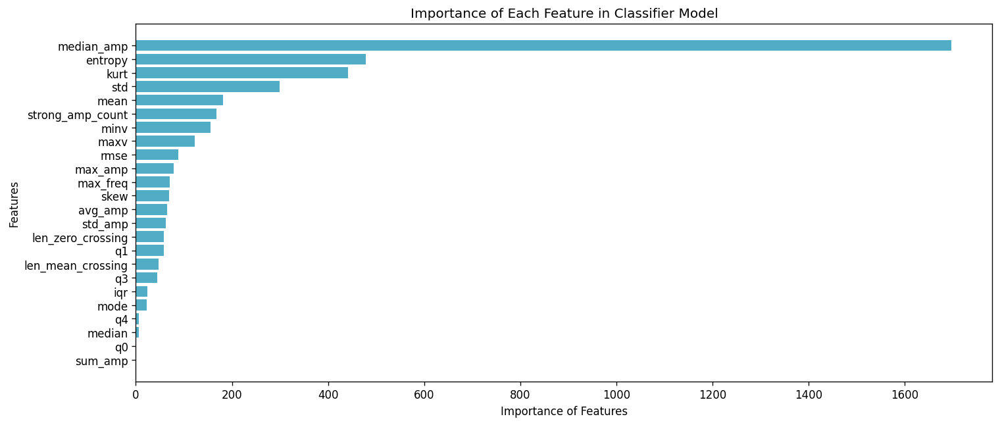

In [ ]:
# histogram of important features
imp = clf[33].best_estimator_.feature_importances_
imp, features = zip(*sorted(zip(imp, features)))
blues = ["#66D7EB", "#51ACC5", "#3E849E", "#2C5F78", "#1C3D52", "#0E1E2B"]
f, ax = plt.subplots(figsize=(14, 6), dpi= 120, facecolor='w', edgecolor='k')
plt.barh(range(len(features)), imp, color=blues[1], align="center")
plt.yticks(range(len(features)), features)
plt.xlabel("Importance of Features")
plt.ylabel("Features")
plt.title("Importance of Each Feature in Classifier Model")

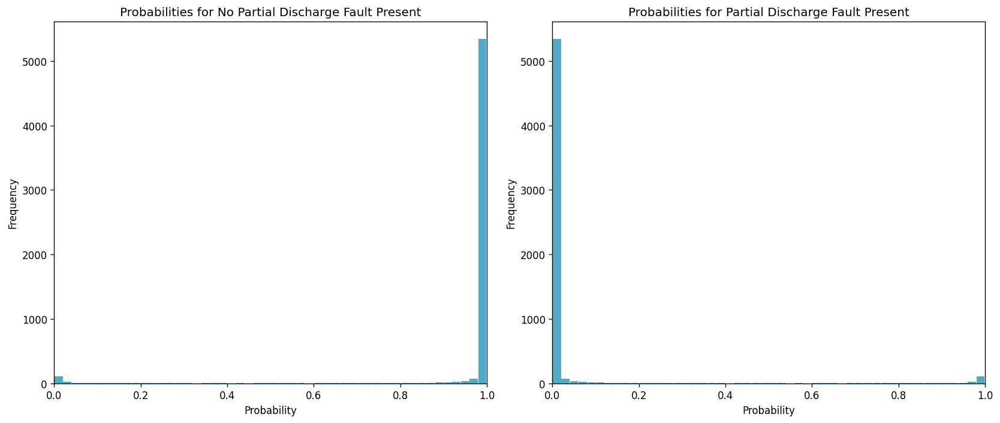

In [ ]:
# histogram of predicted probabilities
blues = ["#66D7EB", "#51ACC5", "#3E849E", "#2C5F78", "#1C3D52", "#0E1E2B"]
f, ax = plt.subplots(figsize=(14, 6), dpi= 120, facecolor='w', edgecolor='k')
nclasses = 2
titles = ["Probabilities for No Partial Discharge Fault Present", "Probabilities for Partial Discharge Fault Present"]
for i in range(nclasses):
    plt.subplot(1, nclasses, i+1)
    plt.hist(train_proba[:, i], bins=50, histtype='bar', rwidth=0.95, color=blues[1])
    plt.xlim(0,1)
    plt.title(titles[i])
    plt.xlabel('Probability')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

In [ ]:
y = label_binarize(y_train, classes=[0, 1])
_, _, th1 = roc_curve(y[:, 0], train_proba[:, 0])
_, _, th2 = roc_curve(y[:, 0], train_proba[:, 1])
print('\nMedian Detection Thresholds for Fault Detection')  # use for setting reprediction thresholds
print(np.median(th1))
print(np.median(th2))


Median Detection Thresholds for Fault Detection
0.9999554753303528
0.027985491789877415


In [ ]:
columns=[] 
for i in range(40):
  col= 'y_pred'+str(i)
  columns.append(col)
e_dataframe = pd.DataFrame(test_pred, columns =columns)  
e_dataframe['y_test'] =y_test.astype(float)
e_dataframe

,y_pred0,y_pred1,y_pred2,y_pred3,y_pred4,y_pred5,y_pred6,y_pred7,y_pred8,y_pred9,y_pred10,y_pred11,y_pred12,y_pred13,y_pred14,y_pred15,y_pred16,y_pred17,y_pred18,y_pred19,y_pred20,y_pred21,y_pred22,y_pred23,y_pred24,y_pred25,y_pred26,y_pred27,y_pred28,y_pred29,y_pred30,y_pred31,y_pred32,y_pred33,y_pred34,y_pred35,y_pred36,y_pred37,y_pred38,y_pred39,y_test
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2870,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2871,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2872,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2873,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:

print('\nPerformance Metrics after Weighted Unbalanced XGBoost Cross Validation')
print('1. The F-1 score of the model {}\n'.format(f1_score(e_dataframe.iloc[:,30], e_dataframe.iloc[:,-1], average='macro')))
print('2. The recall score of the model {}\n'.format(recall_score(e_dataframe.iloc[:,30], e_dataframe.iloc[:,-1], average='macro')))
print('3. The Matthews Correlation Coefficient: {}\n'.format(matthews_corrcoef(e_dataframe.iloc[:,30], e_dataframe.iloc[:,-1])))
print('4. Classification report \n {} \n'.format(classification_report(e_dataframe.iloc[:,30], e_dataframe.iloc[:,-1])))
print('5. Confusion matrix \n {} \n'.format(confusion_matrix(e_dataframe.iloc[:,30], e_dataframe.iloc[:,-1])))



Performance Metrics after Weighted Unbalanced XGBoost Cross Validation
1. The F-1 score of the model 0.800163549013595

2. The recall score of the model 0.8505311821047989

3. The Matthews Correlation Coefficient: 0.608450828672412

4. Classification report 
               precision    recall  f1-score   support

         0.0       0.99      0.97      0.98      2741
         1.0       0.54      0.73      0.62       134

    accuracy                           0.96      2875
   macro avg       0.76      0.85      0.80      2875
weighted avg       0.97      0.96      0.96      2875
 

5. Confusion matrix 
 [[2658   83]
 [  36   98]] 



In [ ]:

model = lgb.LGBMClassifier(boosting_type='gbdt', objective='binary', num_leaves=50,
                                learning_rate=0.1, n_estimators=500, max_depth=6,
                                bagging_fraction=0.9, feature_fraction=0.9, reg_lambda=0.2)

base_models = [model]
n_splits = 5
lgb_stack = Create_ensemble(n_splits = n_splits, base_models = base_models)        

In [ ]:
data_features.fillna(999, inplace=True)

X = data_features.drop(['fault'], axis=1)
Y = data_features['fault'].values
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size= 0.33, random_state=42)
x_train.shape

(5837, 32)

In [ ]:
train_proba, test_proba, train_pred, test_pred, clf , table= lgb_stack.predict(x_train, y_train, x_test)

In [ ]:
table

,CV,Model,f1,mcc,recall
0,0.0,0.0,0.818803,0.670452,0.752258
1,1.0,0.0,0.846560,0.713328,0.788035
2,2.0,0.0,0.827954,0.672120,0.776227
3,3.0,0.0,0.843929,0.712256,0.781243
4,4.0,0.0,0.791354,0.595425,0.748159


In [ ]:
test_pred.shape, y_test.shape

((2875,), (2875,))

In [ ]:
print('\nPerformance Metrics after Weighted Random Forest Cross Validation')
print('1. The F-1 score of the model {}\n'.format(f1_score(y_train, train_pred, average='macro')))
print('2. The recall score of the model {}\n'.format(recall_score(y_train, train_pred, average='macro')))
print('3. The Matthews Correlation Coefficient: {}\n'.format(matthews_corrcoef(y_train, train_pred)))
print('4. Classification reporct \n {} \n'.format(classification_report(y_train, train_pred)))
print('5. Confusion matrix \n {} \n'.format(confusion_matrix(y_train, train_pred)))


Performance Metrics after Weighted Random Forest Cross Validation
1. The F-1 score of the model 0.8255607470629065

2. The recall score of the model 0.7691626022972154

3. The Matthews Correlation Coefficient: 0.6715758442326459

4. Classification reporct 
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      5493
           1       0.87      0.54      0.67       344

    accuracy                           0.97      5837
   macro avg       0.92      0.77      0.83      5837
weighted avg       0.97      0.97      0.96      5837
 

5. Confusion matrix 
 [[5464   29]
 [ 157  187]] 



In [ ]:
df_test = pd.DataFrame() 
test_pred = np.median(test_pred).astype(int)
df_test['y_test'] =y_test.astype(int)
df_test["fault"] = test_pred
# Make Submission File
submission_filename = "/content/drive/MyDrive/Projet Option Stage /prediction_submission_cv.csv"

# Commented out in this notebook but left in as an example to create a submission file
f_o = open(submission_filename, "w+")
f_o.write("signal_id,target\n")
for idx in range(len(df_test)):

    signal_id = df_feature["signal_id"][idx]
    fault = df_test["fault"][idx]
    f_o.write(str(signal_id)+","+str(fault)+"\n")
f_o.close()

In [ ]:
df_test=pd.read_csv('/content/drive/MyDrive/Projet Option Stage /prediction_submission_cv.csv')
df_test

,signal_id,target
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0
...,...,...
2870,2870,0
2871,2871,0
2872,2872,0
2873,2873,0


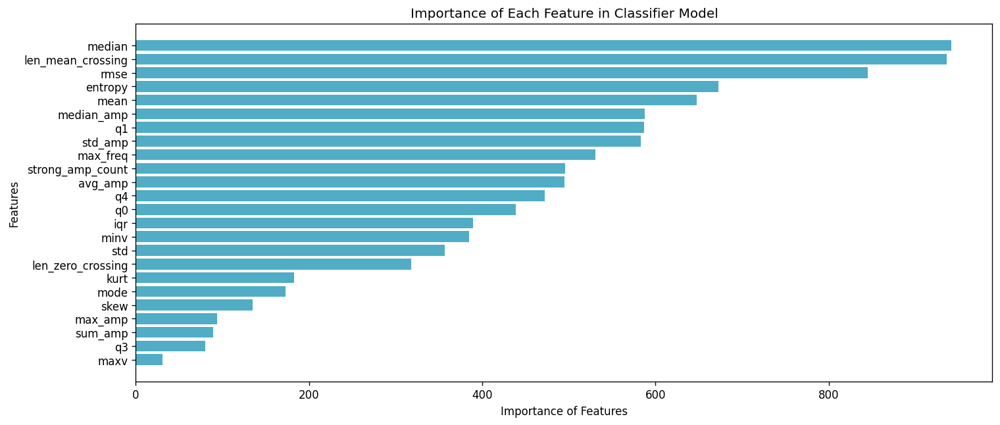

In [ ]:
# histogram of important features
imp = clf[0].feature_importances_
imp, features = zip(*sorted(zip(imp, features)))
blues = ["#66D7EB", "#51ACC5", "#3E849E", "#2C5F78", "#1C3D52", "#0E1E2B"]
f, ax = plt.subplots(figsize=(14, 6), dpi= 120, facecolor='w', edgecolor='k')
plt.barh(range(len(features)), imp, color=blues[1], align="center")
plt.yticks(range(len(features)), features)
plt.xlabel("Importance of Features")
plt.ylabel("Features")
plt.title("Importance of Each Feature in Classifier Model")
plt.show()

In [ ]:
raw_signal_data= np.array(data.T)

meta_train= np.array(metadata_train)
print(raw_signal_data.shape)

(8712, 800000)


tqdm: to check the progress of the model training we can use the Tqdm library in Python to see how much time is remaining for our machine learning model to be trained.

code snippet taken from:https://www.kaggle.com/junkoda/handmade-features

In [ ]:
def compute_spectra(signals, *, m = 1000):
    means = []
    percentiles = []
    percentile_values = (100,99,95,0,1,5,)
    for raw_signal in tqdm(signals):
        
        #normalizing the signal values 
        signal = raw_signal.astype('float32').reshape(-1, m) / 128.0
        
        #mean of signal
        mean = np.mean(signal,axis=1)
        
        #percentiles of signal
        percentile = np.abs(np.percentile(signal,percentile_values,axis=1)-mean)
        
        #calaculating the baseline of percentiles
        baseline = np.percentile(percentile,5.0)
        
        #subtracting the baseline
        percentile = np.maximum(0.0,percentile-baseline)
        
        means.append(mean)
        
        percentiles.append(percentile.T)
        
    res = {}
    res['mean'] = np.array(means)
    res['percentile'] = np.array(percentiles)
    
    return res

In [ ]:
spectra = compute_spectra(raw_signal_data)

100%|██████████| 8712/8712 [04:07<00:00, 35.23it/s]


In [ ]:
print(spectra['mean'].shape)
print(spectra['percentile'].shape)

(8712, 800)
(8712, 800, 6)


**Peak interval:**
Then, within the 800 chunks of the spectra,the peak interval of width=150 that contains the maximum deviation in the max - mean spectrum.

In [ ]:
import tensorflow as tf
tf.compat.v1.disable_eager_execution()
def max_windowed(spec, *, width=150, stride=10):
    """
    Smooth the spectrum with a tophat window function and find the
    peak inteval that maximises the smoothed spectrum.
    
    Returns: d(dict)
      d['w'] (array): smoothed max - mean spectrum
      d['ibegin'] (array): the left edge index of the peak interval
    """
    n = spec.shape[0]
    length = spec.shape[1] # 800
    nspec = spec.shape[2] # 6 spectra

    n_triplet = n // 3

    # Reorganize the max spectrum from 8712 data to 2904 triplets with 3 phases
    max_spec3 = np.empty((n_triplet, length, 3))
    for i_triplet in range(n_triplet):
        max_spec3[i_triplet, :, 0] = spec[3*i_triplet, :, 0] # phase 0
        max_spec3[i_triplet, :, 1] = spec[3*i_triplet + 1, :, 0] # phase 1
        max_spec3[i_triplet, :, 2] = spec[3*i_triplet + 2, :, 0] # phase 2

    x = tf.compat.v1.placeholder(tf.float32, [None, length, 3]) # input spectra before smoothing
    # 800 -> 80: static convolaution
    # convolution but not CNN, the kernel is static
    # smoothing/convolution kernel
    # tophat window function
    # shape (3, 1) adds up 3 phases to one output
    K = np.ones((width, 3, 1), dtype='float32') / width

    W_conv1 = tf.constant(K)
    h_conv1 = tf.nn.conv1d(x, W_conv1, stride=stride, padding='VALID')
    
    with tf.compat.v1.Session() as sess:
        w = sess.run(h_conv1, feed_dict={x:max_spec3})

    imax = np.argmax(w[:, :, 0], axis=1) # index of maximum smoothed spectrum
    
    d = {}
    d['w'] = w # smoothed max spectrum
    d['ibegin'] = imax*stride
    
    return d

In [ ]:
peaks = max_windowed(spectra['percentile'])

In [ ]:
peaks['ibegin'].shape

(2904,)

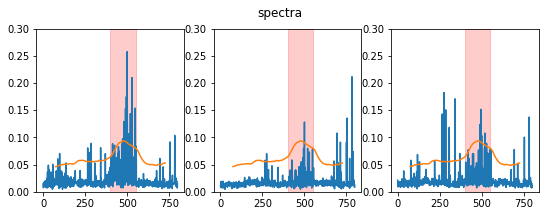

In [ ]:
i_vis = 0
nrow = 1
ncol = 3
plt.figure(figsize=(3*ncol, 3*nrow))
plt.suptitle('spectra')

for j in range(3):
    plt.subplot(nrow, ncol, j + 1)
    plt.ylim(0, 0.3)
    
    ibegin = peaks['ibegin'][i_vis]
    plt.axvspan(ibegin, ibegin + 150, alpha=0.2, color='red')
    
    # max - mean spectrum
    plt.plot(spectra['percentile'][i_vis + j, :, 0])
    
    # smoothed max - mean spectrum
    xx = np.arange(peaks['w'].shape[1])*10 + 150//2
    plt.plot(xx, peaks['w'][i_vis])

In [ ]:
def compute_spectra_features(spectra,peaks):
    
    
    percentiles = spectra['percentile']
    
    n = percentiles.shape[0]
    length = percentiles.shape[1]
    nspec = percentiles.shape[2]
    
    n_signals = n//3
    
    phase_percentiles = np.empty((n_signals,length,nspec,3))
    
    #creating an array which combines all 3 phases
    for i_signal in range(n_signals):
        phase_percentiles[i_signal, :, :, 0] = percentiles[3*i_signal, :, :] # phase 0
        phase_percentiles[i_signal, :, :, 1] = percentiles[3*i_signal + 1, :, :] # phase 1
        phase_percentiles[i_signal, :, :, 2] = percentiles[3*i_signal + 2, :, :] # phase 2
    
    
    width = 150
    
    n_perc_features = 3
    
    #array to store final features
    spectra_features = np.empty((n_signals,n_perc_features*nspec*3 + 3))
    
    #array to store percentile features
    perc_phase_features = np.empty((n_signals,n_perc_features,nspec,3))

    for i_signal in range(n_signals):
      
      #max of the total percentile features
      perc_phase_features[i_signal,0,:,:] = np.max(phase_percentiles[i_signal,:,:,:],axis = 0)
      
      peak_start = peaks['ibegin'][i_signal]
      peak_end = peak_start +width
      peak_mid = peak_start+width//2
      
      #mean of the percentle features in peak interval
      perc_phase_features[i_signal,1,:,:] = np.mean(phase_percentiles[i_signal,peak_start:peak_end,:,:],axis = 0)
      
      #max of the percentle features in peak interval
      perc_phase_features[i_signal,2,:,:] = np.max(phase_percentiles[i_signal,peak_start:peak_end,:,:],axis = 0)
      
      #storing the mean value at the mid index of peak interval of each phase
      spectra_features[i_signal,0] = spectra['mean'][3*i_signal,peak_mid]
      spectra_features[i_signal,1] = spectra['mean'][3*i_signal+1,peak_mid]
      spectra_features[i_signal,2] = spectra['mean'][3*i_signal+2,peak_mid]
    
    #storing all the features
    shape = perc_phase_features.shape
    spectra_features[:,3:] = perc_phase_features.reshape(shape[0], shape[1]*shape[2]*shape[3])
    
    return spectra_features
    
    

In [ ]:
spectra_features = compute_spectra_features(spectra, peaks)

In [ ]:
spectra_features.shape

(2904, 57)

** Fast Fourier Transform **

signal processing reference:http://ataspinar.com/2018/04/04/machine-learning-with-signal-processing-techniques/

used to convert a signal from time domain to frequency domain

In [ ]:
fourier_values = fft(data['0'].values)
fourier_values.shape

(800000,)

In [ ]:
#N is number of points in our input signal
N=800000
#T is the time period which is inverseof frequency which is 50Hz
T = 1/50
#fft_values contains the filtered useful values from fft_values_ vector
fourier_values_filtered = 2.0/N * np.abs(fourier_values[0:N//2])
#f_values contains the frquency values
f_values = np.linspace(0.0, 1.0/(2.0*T), N//2)

In [ ]:
#N is number of points in our input signal
N=800000
#T is the time period which is inverseof frequency which is 50Hz
T = 1/50
#fft_values contains the filtered useful values from fft_values_ vector
fourier_values_filtered = 2.0/N * np.abs(fourier_values[0:N//2])
#f_values contains the frquency values
f_values = np.linspace(0.0, 1.0/(2.0*T), N//2)

fig = go.Figure(data=go.Scatter(x = f_values, y = fourier_values_filtered,mode = 'lines'))
fig.update_layout(
    title="frquency spectrum",
    xaxis_title="Frequency",
    yaxis_title="Amplitude",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    )
)
fig.show()

In [ ]:
def extract_fourier_features(signal,N=800000,T=1/50):
    '''
    converts a signal from time spectrum to frequency spectrum
    and returns only the features required as mentioned above
    '''
    fourier_values = fft(signal)
    fourier_values_filtered = 2.0/N * np.abs(fourier_values[0:N//2])
    return fourier_values_filtered


def filter_features_fourier(features,mph,no_features=8):
    '''
    returns fourier transformed features by extracting peaks and 
    considering only required number of peaks.
    mph-detect peaks that are greater than minimum peak height
    '''
    indices_peaks = detect_peaks(features,mph = mph)
    #print(indices_peaks)
    values = features[indices_peaks]
    if len(values)< no_features:
        return np.append(values , [0]*(no_features-len(values)))
    else:
        return values[:no_features]


**Power Spectral density**

similiar to fft but this also considers the power distribution at each frequency

In [ ]:
f_values, psd_values = welch(data['0'].values, fs=50)

In [ ]:

f_values, psd_values = welch(data['0'].values, fs=50)fig = go.Figure(data=go.Scatter(x = f_values, y = psd_values,mode = 'lines'))
fig.update_layout(
    title="frquency spectrum",
    xaxis_title="Frequency",
    yaxis_title="PSD",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="#7f7f7f"
    )
)
fig.show()

In [ ]:
def extract_psd_features(signal,fs=50):
    '''
    returns the features from a time spectrum signal(similiar to fft 
    but also considers power spectral density)
    '''
    f_values, psd_values = welch(signal, fs=50)
    return psd_values

def filter_features_fourier(features,mph,no_features=8):
    '''
    returns fourier transformed features by extracting peaks and 
    considering only required number of peaks.
    mph-detect peaks that are greater than minimum peak height
    '''
    indices_peaks = detect_peaks(features,mph = mph)
    #print(indices_peaks)
    values = features[indices_peaks]
    if len(values)< no_features:
        return np.append(values , [0]*(no_features-len(values)))
    else:
        return values[:no_features]

In [ ]:
psd_values= extract_psd_features(data['0'].values,fs=50)
np.mean(psd_values,axis=0)

0.039909437

In [ ]:
def extract_stat_features(signal_features):
    '''
    used to extract statistical features from power spectral density
    '''
    percentiles = (5,25,50,75)
    #array to store
    filtered_features = np.zeros((len(signal_features),8))
    #mean
    filtered_features[:,0] = np.mean(signal_features,axis=1)
    #standard deviation
    filtered_features[:,1] = np.std(signal_features,axis=1)
    #maximum
    filtered_features[:,2] = np.max(signal_features,axis=1)
    #minimum
    filtered_features[:,3] = np.min(signal_features,axis=1)
    #mean
    filtered_features[:,4] = np.mean(signal_features,axis=1)
    #percentiles
    filtered_features[:,4:] = np.percentile(signal_features,percentiles,axis=1).T
    
    return filtered_features

In [ ]:
total_features = []
   
for i in tqdm(range(0,8712)):
    fourier_features = np.empty((3,8))
    features = []    
    signal =  pq.read_pandas('/content/drive/MyDrive/Projet Option Stage /train.parquet',columns=[str(i)]).to_pandas()[str(i)].values

    #minimum peak height which can be used to filter fourier features
    mph = signal.min() + (signal.max() - np.abs(signal.min()))/10
    
    #fourier features
    fourier_features_ = extract_fourier_features(signal)
    fourier_features = filter_features_fourier(fourier_features_,mph)
    
    features.extend(fourier_features)

    total_features.append(features) 

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.

 90%|█████████ | 7879/8712 [45:17<04:53,  2.83it/s]





 90%|█████████ | 7880/8712 [45:17<04:34,  3.03it/s]





 90%|█████████ | 7881/8712 [45:17<04:47,  2.89it/s]





 90%|█████████ | 7882/8712 [45:18<04:52,  2.84it/s]





 90%|█████████ | 7883/8712 [45:18<04:56,  2.79it/s]





 90%|█████████ | 7884/8712 [45:18<04:35,  3.01it/s]





 91%|█████████ | 7885/8712 [45:19<04:42,  2.93it/s]





 91%|█████████ | 7886/8712 [45:19<04:52,  2.82it/s]





 91%|█████████ | 7887/8712 [45:19<04:36,  2.98it/s]





 91%|█████████ | 7888/8712 [45:20<04:51,  2.82it/s]





 91%|█████████ | 7889/8712 [45:20<04:54,  2.79it/s]





 91%|█████████ | 7890/8712 [45:20<05:00,  2.74it/s]





 91%|█████████ | 7891/8712 [45:21<04:36,  2.97it/s]





 91%|█████████ | 7892/8712 [45:21<04:44,  2.88it/s]





 91%|█████████ | 7893/8712 [45:21<04:50,  2.82it/s]





 91%|█████████ | 7894/8712 [45:22<04:30,  3.02it/s]





 91%|████

In [ ]:
sig_features = np.array(total_features)

cols=[]
for i in range(0,8):
  cols.append('feat'+str(i))
fourier_df = pd.DataFrame(sig_features, columns =cols)  
fourier_df.to_csv('/content/drive/MyDrive/Projet Option Stage /'+"fourier_feat.csv", sep=",")